In [2]:
import numpy as np
import pandas as pd
import matplotlib
import bokeh 
import plotly
import sys
import plotly.express as px
import pandas_profiling as pp
#cf commentaire ci-dessous si le module n'est pas installé

from sklearn.preprocessing import LabelEncoder


%matplotlib inline
import matplotlib.pyplot as plt

import seaborn as sns

sns.set_style('darkgrid')
sns.set_palette('Set2')

from geopy.geocoders import Nominatim
import folium
from folium.plugins import HeatMap
import calendar

from datetime import datetime
from termcolor import colored
from IPython.display import Image

import warnings
warnings.filterwarnings("ignore", category=UserWarning, module="matplotlib")

from tqdm import tqdm
# Afficher l'état d'avancement
tqdm.pandas()

In [3]:
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

import matplotlib.pyplot as plt
import seaborn as sns

import geopandas as gpd
from shapely.geometry import Point

from mpl_toolkits.axes_grid1 import make_axes_locatable
# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

from sklearn.neighbors import DistanceMetric
from math import radians

from tqdm import tqdm

In [3]:
df = pd.read_csv("../data/weatherAUS.csv")
aus_town_gps = pd.read_csv("../data/aus_town_gps.csv",sep=",")
climatsaus = pd.read_csv("../data/climatsAUS_v2.csv",sep=";")

In [4]:
df.columns = df.columns.str.lower()
aus_town_gps.columns = aus_town_gps.columns.str.lower()
climatsaus.columns = climatsaus.columns.str.lower()
# le type de la date est à changer en date time
df['date'] = pd.to_datetime(df['date'], format='%Y-%m-%d')
df['year'] = df['date'].dt.year.astype('int16')
df['month'] = df['date'].dt.month.astype('int16')
df['day'] = df['date'].dt.day.astype('int16')

In [5]:
climatsaus.columns

Index(['location', 'climat_koppen'], dtype='object')

In [6]:
df.columns

Index(['date', 'location', 'mintemp', 'maxtemp', 'rainfall', 'evaporation',
       'sunshine', 'windgustdir', 'windgustspeed', 'winddir9am', 'winddir3pm',
       'windspeed9am', 'windspeed3pm', 'humidity9am', 'humidity3pm',
       'pressure9am', 'pressure3pm', 'cloud9am', 'cloud3pm', 'temp9am',
       'temp3pm', 'raintoday', 'raintomorrow', 'year', 'month', 'day'],
      dtype='object')

In [7]:
longitudes = list(aus_town_gps.longitude)
latitudes = list(aus_town_gps.latitude)
villes = list(aus_town_gps.location)

In [8]:
climats_type = {'Am':'chaud_humide',
                'Aw':'chaud_humide',
                'Cfa':'chaud_humide',
                'Cfb':'tempéré_froid', 
                'Cfc':'tempéré_froid', 
                'BSh':'sec',
                'BSk':'sec',
                'Bsk':'sec', 
                'Bwh':'sec',
                'Csa':'méditerranéen',
                'Csb':'méditerranéen'              
               }
climatsaus['climat']=climatsaus['climat_koppen'].map(climats_type)

In [9]:
#Fusion des dataframes
df = pd.merge(df, aus_town_gps, how='left', left_on="location",right_on="location")
df = pd.merge(df, climatsaus, how='left', left_on="location",right_on="location")
df.head(10)

,date,location,mintemp,maxtemp,rainfall,evaporation,sunshine,windgustdir,windgustspeed,winddir9am,...,temp3pm,raintoday,raintomorrow,year,month,day,latitude,longitude,climat_koppen,climat
0,2008-12-01,Albury,13.4,22.9,0.6,NaN,NaN,W,44.0,W,...,21.8,No,No,2008,12,1,-36.065766,146.910315,Cfa,chaud_humide
1,2008-12-02,Albury,7.4,25.1,0.0,NaN,NaN,WNW,44.0,NNW,...,24.3,No,No,2008,12,2,-36.065766,146.910315,Cfa,chaud_humide
2,2008-12-03,Albury,12.9,25.7,0.0,NaN,NaN,WSW,46.0,W,...,23.2,No,No,2008,12,3,-36.065766,146.910315,Cfa,chaud_humide
3,2008-12-04,Albury,9.2,28.0,0.0,NaN,NaN,NE,24.0,SE,...,26.5,No,No,2008,12,4,-36.065766,146.910315,Cfa,chaud_humide
4,2008-12-05,Albury,17.5,32.3,1.0,NaN,NaN,W,41.0,ENE,...,29.7,No,No,2008,12,5,-36.065766,146.910315,Cfa,chaud_humide
5,2008-12-06,Albury,14.6,29.7,0.2,NaN,NaN,WNW,56.0,W,...,28.9,No,No,2008,12,6,-36.065766,146.910315,Cfa,chaud_humide
6,2008-12-07,Albury,14.3,25.0,0.0,NaN,NaN,W,50.0,SW,...,24.6,No,No,2008,12,7,-36.065766,146.910315,Cfa,chaud_humide
7,2008-12-08,Albury,7.7,26.7,0.0,NaN,NaN,W,35.0,SSE,...,25.5,No,No,2008,12,8,-36.065766,146.910315,Cfa,chaud_humide
8,2008-12-09,Albury,9.7,31.9,0.0,NaN,NaN,NNW,80.0,SE,...,30.2,No,Yes,2008,12,9,-36.065766,146.910315,Cfa,chaud_humide
9,2008-12-10,Albury,13.1,30.1,1.4,NaN,NaN,W,28.0,S,...,28.2,Yes,No,2008,12,10,-36.065766,146.910315,Cfa,chaud_humide


In [10]:
def missing_values(df):
    missing_counts = df.isnull().sum().rename('missing_count')
    no_missing_counts = df.notnull().sum().rename('no_missing_count')
    missing_percentages = (missing_counts / (missing_counts + no_missing_counts)).rename('missing_percentage')
    missing_df = pd.DataFrame({'missing_count': missing_counts, 'no_missing_count': no_missing_counts, 'missing_percentage': missing_percentages})
    missing_df['missing_percentage'] = missing_df['missing_percentage'].map('{:.2%}'.format)
    return missing_df.sort_values('missing_count', ascending=False)

missing_values(df)

,missing_count,no_missing_count,missing_percentage
sunshine,69835,75625,48.01%
evaporation,62790,82670,43.17%
cloud3pm,59358,86102,40.81%
cloud9am,55888,89572,38.42%
pressure9am,15065,130395,10.36%
pressure3pm,15028,130432,10.33%
winddir9am,10566,134894,7.26%
windgustdir,10326,135134,7.10%
windgustspeed,10263,135197,7.06%
humidity3pm,4507,140953,3.10%


In [11]:
import pandas as pd
import math
df_gps = aus_town_gps
# convertir les degrés en radians
df_gps['latitude'] = df_gps['latitude'].apply(math.radians)
df_gps['longitude'] = df_gps['longitude'].apply(math.radians)

# fonction pour calculer la distance entre deux points en utilisant la formule Haversine
def distance(lat1, long1, lat2, long2):
    R = 6371 # Rayon de la Terre en kilomètres
    dlat = lat2 - lat1
    dlon = long2 - long1
    a = math.sin(dlat / 2) ** 2 + math.cos(lat1) * math.cos(lat2) * math.sin(dlon / 2) ** 2
    c = 2 * math.atan2(math.sqrt(a), math.sqrt(1 - a))
    d = R * c
    return d

# création d'un dictionnaire pour stocker les distances relatives entre les villes
distances = {}

# parcourir les villes et calculer les distances entre elles
       
for i in range(len(df_gps)):
    ville1 = df_gps.loc[i, 'location']
    for j in range(i+1, len(df_gps)):
        ville2 = df_gps.loc[j, 'location']
        lat1, long1 = df_gps.loc[i, ['latitude', 'longitude']]
        lat2, long2 = df_gps.loc[j, ['latitude', 'longitude']]
        dist = distance(lat1, long1, lat2, long2)
        distances[f"{ville1}-{ville2}"] = dist        


# afficher les distances relatives entre les villes
for ville, dist in distances.items():
    pass
    #print(f"{ville}: {dist:.2f} km")


In [12]:
import pandas as pd
import geopy.distance
from collections import defaultdict

# Créer un dictionnaire de listes pour stocker les villes les plus proches dans le même climat de Köppen
villes_proches_par_climat = defaultdict(list)

# Parcourir chaque ville
for ville in df["location"].unique():
    
    # Sélectionner les données pour la ville en cours
    data_ville = df[df["location"] == ville]
    
    # Récupérer le climat de Köppen pour la ville en cours
    climat_ville = data_ville.iloc[0]["climat_koppen"]
    
    # Récupérer les coordonnées GPS de la ville en cours
    lat_ville = data_ville.iloc[0]["latitude"]
    lon_ville = data_ville.iloc[0]["longitude"]
    
    # Parcourir chaque autre ville
    for autre_ville in df["location"].unique():
        
        # Vérifier si l'autre ville est différente de la ville en cours
        if autre_ville != ville:
            
            # Sélectionner les données pour l'autre ville
            data_autre_ville = df[df["location"] == autre_ville]
            
            # Récupérer le climat de Köppen pour l'autre ville
            climat_autre_ville = data_autre_ville.iloc[0]["climat_koppen"]
            
            # Vérifier si le climat de Köppen est le même pour les deux villes
            if climat_autre_ville == climat_ville:
                
                # Récupérer les coordonnées GPS de l'autre ville
                lat_autre_ville = data_autre_ville.iloc[0]["latitude"]
                lon_autre_ville = data_autre_ville.iloc[0]["longitude"]
                
                # Calculer la distance entre les deux villes en kilomètres
                distance = geopy.distance.geodesic((lat_ville, lon_ville), (lat_autre_ville, lon_autre_ville)).km
                
                # Si la distance est inférieure à 500 km, ajouter l'autre ville à la liste des villes proches de la ville en cours
                if distance < 500:
                    villes_proches_par_climat[ville].append((autre_ville, distance))
    
    # Trier la liste des villes proches pour la ville en cours par distance croissante
    villes_proches_par_climat[ville].sort(key=lambda x: x[1])

# Afficher le dictionnaire de listes des villes les plus proches dans le même climat de Köppen pour chaque ville
print(villes_proches_par_climat)


defaultdict(<class 'list'>, {'Albury': [('WaggaWagga', 170.56817640486216), ('BadgerysCreek', 428.94497747708596), ('Penrith', 432.1702537699683), ('SydneyAirport', 455.23423960330297), ('Sydney', 464.30789868864946)], 'BadgerysCreek': [('Penrith', 15.223106799869479), ('Sydney', 37.794462805224974), ('SydneyAirport', 41.15322946568301), ('NorahHead', 98.31290855001555), ('Newcastle', 140.20655197250213), ('Williamtown', 209.55881995103334), ('WaggaWagga', 345.1234288052125), ('Albury', 428.94497747708596), ('CoffsHarbour', 457.3716398903428), ('Moree', 495.27049184897606)], 'Cobar': [], 'CoffsHarbour': [('Williamtown', 247.8268967414969), ('GoldCoast', 249.34202828287877), ('Newcastle', 322.67119079373043), ('Moree', 326.8660259900974), ('Brisbane', 342.6291848827666), ('NorahHead', 367.0533507381007), ('Sydney', 431.87879048515094), ('Penrith', 448.69824261184664), ('SydneyAirport', 449.65579037585655), ('BadgerysCreek', 457.3716398903428)], 'Moree': [('CoffsHarbour', 326.86602599009

In [13]:
missing_values(df)

,missing_count,no_missing_count,missing_percentage
sunshine,69835,75625,48.01%
evaporation,62790,82670,43.17%
cloud3pm,59358,86102,40.81%
cloud9am,55888,89572,38.42%
pressure9am,15065,130395,10.36%
pressure3pm,15028,130432,10.33%
winddir9am,10566,134894,7.26%
windgustdir,10326,135134,7.10%
windgustspeed,10263,135197,7.06%
humidity3pm,4507,140953,3.10%


In [19]:
def remplacer_valeurs_manquantes(row, col):
    ville = row['location']
    date = row['date']
    val = row[col]
    if np.isnan(val):
        for ville_proche, distance in villes_proches_par_climat[ville]:
            row_proche = df[(df['location'] == ville_proche) & (df['date'] == date)]
            if not row_proche.empty:
                val_proche = row_proche.iloc[0][col]
                if not np.isnan(val_proche):
                    return val_proche
            else:
                row_proche_veille = df[(df['location'] == ville_proche) & (df['date'] == date - pd.Timedelta(days=1))]
                row_proche_demain = df[(df['location'] == ville_proche) & (df['date'] == date + pd.Timedelta(days=1))]
                if not row_proche_veille.empty:
                    val_proche = row_proche_veille.iloc[0][col]
                    if not np.isnan(val_proche):
                        return val_proche
                elif not row_proche_demain.empty:
                    val_proche = row_proche_demain.iloc[0][col]
                    if not np.isnan(val_proche):
                        return val_proche
    return val


In [20]:
df['sunshine'] = df.progress_apply(remplacer_valeurs_manquantes, args=('sunshine',), axis=1)
df['cloud9am'] = df.progress_apply(remplacer_valeurs_manquantes, args=('cloud9am',), axis=1)
df['cloud3pm'] = df.progress_apply(remplacer_valeurs_manquantes, args=('cloud3pm',), axis=1)
df['evaporation'] = df.progress_apply(remplacer_valeurs_manquantes, args=('evaporation',), axis=1)

100%|██████████| 145460/145460 [11:42<00:00, 207.00it/s]  


In [21]:
missing_values(df)

,missing_count,no_missing_count,missing_percentage
sunshine,21163,124297,14.55%
cloud3pm,17758,127702,12.21%
cloud9am,16999,128461,11.69%
evaporation,15346,130114,10.55%
pressure9am,15065,130395,10.36%
pressure3pm,15028,130432,10.33%
winddir9am,10566,134894,7.26%
windgustdir,10326,135134,7.10%
windgustspeed,10263,135197,7.06%
humidity3pm,4507,140953,3.10%


In [4]:
df.to_csv('df_weather_upgraded.csv', index=False)

NameError: name 'df' is not defined

In [27]:
df = pd.read_csv("df_weather_upgraded.csv")

In [28]:
df.head()

,date,location,mintemp,maxtemp,rainfall,evaporation,sunshine,windgustdir,windgustspeed,winddir9am,...,temp3pm,raintoday,raintomorrow,year,month,day,latitude,longitude,climat_koppen,climat
0,2008-12-01,Albury,13.4,22.9,0.6,7.6,10.9,W,44.0,W,...,21.8,No,No,2008,12,1,-36.065766,146.910315,Cfa,chaud_humide
1,2008-12-02,Albury,7.4,25.1,0.0,12.0,12.9,WNW,44.0,NNW,...,24.3,No,No,2008,12,2,-36.065766,146.910315,Cfa,chaud_humide
2,2008-12-03,Albury,12.9,25.7,0.0,8.0,8.0,WSW,46.0,W,...,23.2,No,No,2008,12,3,-36.065766,146.910315,Cfa,chaud_humide
3,2008-12-04,Albury,9.2,28.0,0.0,10.0,2.2,NE,24.0,SE,...,26.5,No,No,2008,12,4,-36.065766,146.910315,Cfa,chaud_humide
4,2008-12-05,Albury,17.5,32.3,1.0,4.8,6.7,W,41.0,ENE,...,29.7,No,No,2008,12,5,-36.065766,146.910315,Cfa,chaud_humide


In [29]:
badly_named = {"AliceSprings":"Alice Springs",
               "BadgerysCreek":"Badgerys Creek",
               "CoffsHarbour": "Coffs Harbour",
               "GoldCoast": "Gold Coast",
               "MelbourneAirport": "Melbourne Airport",
               "MountGambier": "Mount Gambier",
               "MountGinini": "Mount Ginini",
               "NorahHead": "Norah Head",
               "NorfolkIsland": "Norfolk Island",
               "PearceRAAF": "Pearce RAAF",
               "PerthAirport": "Perth Airport",
               "SalmonGums": "Salmon Gums",
               "SydneyAirport": "Sydney Airport",
               "WaggaWagga": "Wagga Wagga"}
df["location"] = df["location"].apply(lambda x: badly_named[x] if x in badly_named.keys() else x)

In [30]:
df = df.dropna(axis = 0, how = 'any') 
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 96158 entries, 0 to 145034
Data columns (total 30 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   date           96158 non-null  object 
 1   location       96158 non-null  object 
 2   mintemp        96158 non-null  float64
 3   maxtemp        96158 non-null  float64
 4   rainfall       96158 non-null  float64
 5   evaporation    96158 non-null  float64
 6   sunshine       96158 non-null  float64
 7   windgustdir    96158 non-null  object 
 8   windgustspeed  96158 non-null  float64
 9   winddir9am     96158 non-null  object 
 10  winddir3pm     96158 non-null  object 
 11  windspeed9am   96158 non-null  float64
 12  windspeed3pm   96158 non-null  float64
 13  humidity9am    96158 non-null  float64
 14  humidity3pm    96158 non-null  float64
 15  pressure9am    96158 non-null  float64
 16  pressure3pm    96158 non-null  float64
 17  cloud9am       96158 non-null  float64
 18  cloud

In [31]:
# caractéristiques géographiques (attention, il y a des coquilles, dictionnaire à consolider)
geography = {
    'Albury': 'valley',
    'Badgerys Creek': 'coastal',
    'Cobar': 'desert',
    'Coffs Harbour': 'coastal',
    'Moree': 'valley',
    'Newcastle': 'mountainous',
    'Norah Head': 'coastal',
    'Norfolk Island': 'island',
    'Penrith': 'coastal',
    'Richmond': 'bris',
    'Sydney': 'coastal',
    'Sydney Airport': 'coastal',
    'Wagga Wagga': 'valley',
    'Williamtown': 'valley',
    'Wollongong': 'coastal',
    'Canberra': 'mountainous',
    'Tuggeranong': 'mountainous',
    'Mount Ginini': 'mountainous',
    'Ballarat': 'valley',
    'Bendigo': 'valley',
    'Sale': 'valley',
    'Melbourne Airport': 'valley',
    'Melbourne': 'valley',
    'Mildura': 'desert',
    'Nhil': 'mountainous',
    'Portland': 'coastal',
    'Watsonia': 'valley',
    'Dartmoor': 'valley',
    'Brisbane': 'coastal',
    'Cairns': 'coastal',
    'Gold Coast': 'coastal',
    'Townsville': 'coastal',
    'Adelaide': 'coastal',
    'Mount Gambier': 'valley',
    'Nuriootpa': 'valley',
    'Woomera': 'desert',
    'Albany': 'coastal',
    'Witchcliffe': 'coastal',
    'Pearce RAAF': 'coastal',
    'Perth Airport': 'coastal',
    'Perth': 'coastal',
    'Salmon Gums': 'valley',
    'Walpole': 'coastal',
    'Hobart': 'coastal',
    'Launceston': 'valley',
    'Alice Springs': 'desert',
    'Darwin': 'coastal',
    'Katherine': 'desert',
    'Uluru': 'desert'
}


In [32]:
position = {
  'Albury': 'S',
  'Badgerys Creek': 'E',
  'Cobar': 'N',
  'Coffs Harbour': 'S',
  'Moree': 'N',
  'Norah Head': 'S',
  'Norfolk Island': 'E',
  'Sydney': 'E',
  'Sydney Airport': 'E',
  'Wagga Wagga': 'S',
  'Williamtown': 'S',
  'Wollongong': 'S',
  'Canberra': 'S',
  'Tuggeranong': 'S',
  'Ballarat': 'S',
  'Bendigo': 'S',
  'Sale': 'S',
  'Melbourne Airport': 'S',
  'Melbourne': 'S',
  'Mildura': 'S',
  'Portland': 'S',
  'Watsonia': 'S',
  'Dartmoor': 'S',
  'Brisbane': 'E',
  'Cairns': 'E',
  'Gold Coast': 'E',
  'Townsville': 'E',
  'Mount Gambier': 'S',
  'Nuriootpa': 'S',
  'Woomera': 'S',
  'Witchcliffe': 'W',
  'Pearce RAAF': 'W',
  'Perth Airport': 'W',
  'Perth': 'W',
  'Walpole': 'W',
  'Hobart': 'S',
  'Launceston': 'S',
  'Alice Springs': 'N',
  'Darwin': 'N',
  'Katherine': 'N',
  'Uluru': 'S'
}


In [33]:
df['geography'] = df['location'].map(geography)

In [34]:
df['position'] = df['location'].map(geography)

In [35]:
print(df.isnull().sum())

date             0
location         0
mintemp          0
maxtemp          0
rainfall         0
evaporation      0
sunshine         0
windgustdir      0
windgustspeed    0
winddir9am       0
winddir3pm       0
windspeed9am     0
windspeed3pm     0
humidity9am      0
humidity3pm      0
pressure9am      0
pressure3pm      0
cloud9am         0
cloud3pm         0
temp9am          0
temp3pm          0
raintoday        0
raintomorrow     0
year             0
month            0
day              0
latitude         0
longitude        0
climat_koppen    0
climat           0
geography        0
position         0
dtype: int64


Carte interactive : il est possible de filtrer les champs avec la légende et d'afficher les labels en survolants les points


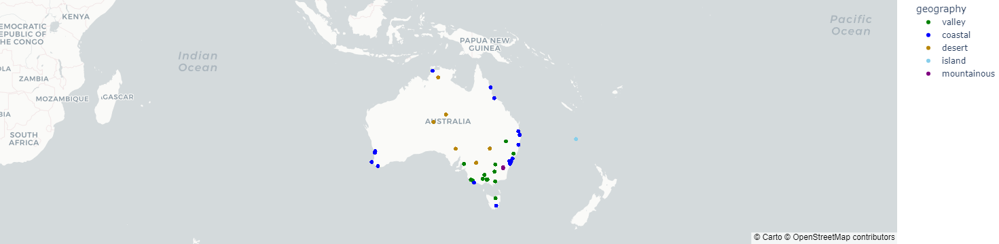

In [36]:
# Définition des couleurs pour chaque type de géographie
colors = {'coastal': 'blue', 'valley': 'green', 'mountainous': 'purple', 'desert': 'darkgoldenrod', 'island' : 'skyblue'}

# Figure Plotly qui permet d'afficher la ville, le climat et les coordonnées GPS en survolant le point
fig = px.scatter_mapbox(df, lat='latitude', lon='longitude', color='geography', color_discrete_map=colors, title='Climats des villes en Australie', hover_name='location', hover_data=['geography'])

# Référence de tuile
fig.update_layout(mapbox_style='carto-positron')

# Limites de la carte et le zoom de départ
fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0}, mapbox_center_lat=-25, mapbox_center_lon=135, mapbox_zoom=2)

print("Carte interactive : il est possible de filtrer les champs avec la légende et d'afficher les labels en survolants les points")
fig.show()



In [37]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 96158 entries, 0 to 145034
Data columns (total 32 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   date           96158 non-null  object 
 1   location       96158 non-null  object 
 2   mintemp        96158 non-null  float64
 3   maxtemp        96158 non-null  float64
 4   rainfall       96158 non-null  float64
 5   evaporation    96158 non-null  float64
 6   sunshine       96158 non-null  float64
 7   windgustdir    96158 non-null  object 
 8   windgustspeed  96158 non-null  float64
 9   winddir9am     96158 non-null  object 
 10  winddir3pm     96158 non-null  object 
 11  windspeed9am   96158 non-null  float64
 12  windspeed3pm   96158 non-null  float64
 13  humidity9am    96158 non-null  float64
 14  humidity3pm    96158 non-null  float64
 15  pressure9am    96158 non-null  float64
 16  pressure3pm    96158 non-null  float64
 17  cloud9am       96158 non-null  float64
 18  cloud

In [38]:
df['raintoday'] = df['raintoday'].map({'Yes': 1, 'No': 0})
df['raintomorrow'] = df['raintomorrow'].map({'Yes': 1, 'No': 0})

In [39]:
df.head()

,date,location,mintemp,maxtemp,rainfall,evaporation,sunshine,windgustdir,windgustspeed,winddir9am,...,raintomorrow,year,month,day,latitude,longitude,climat_koppen,climat,geography,position
0,2008-12-01,Albury,13.4,22.9,0.6,7.6,10.9,W,44.0,W,...,0,2008,12,1,-36.065766,146.910315,Cfa,chaud_humide,valley,valley
1,2008-12-02,Albury,7.4,25.1,0.0,12.0,12.9,WNW,44.0,NNW,...,0,2008,12,2,-36.065766,146.910315,Cfa,chaud_humide,valley,valley
2,2008-12-03,Albury,12.9,25.7,0.0,8.0,8.0,WSW,46.0,W,...,0,2008,12,3,-36.065766,146.910315,Cfa,chaud_humide,valley,valley
3,2008-12-04,Albury,9.2,28.0,0.0,10.0,2.2,NE,24.0,SE,...,0,2008,12,4,-36.065766,146.910315,Cfa,chaud_humide,valley,valley
4,2008-12-05,Albury,17.5,32.3,1.0,4.8,6.7,W,41.0,ENE,...,0,2008,12,5,-36.065766,146.910315,Cfa,chaud_humide,valley,valley


In [40]:
df = df.drop(columns=['location', 'date'],axis=1) 

In [41]:
cat_cols = [col for col in df.columns if df[col].dtypes in ['object', 'category']]
num_cols = [col for col in df.columns if df[col].dtypes in ['int', 'float']]
print("categorical columns :", cat_cols)
print('\n')
print("numeric columns :", num_cols)

categorical columns : ['windgustdir', 'winddir9am', 'winddir3pm', 'climat_koppen', 'climat', 'geography', 'position']


numeric columns : ['mintemp', 'maxtemp', 'rainfall', 'evaporation', 'sunshine', 'windgustspeed', 'windspeed9am', 'windspeed3pm', 'humidity9am', 'humidity3pm', 'pressure9am', 'pressure3pm', 'cloud9am', 'cloud3pm', 'temp9am', 'temp3pm', 'latitude', 'longitude']


In [42]:
df = pd.get_dummies(df, columns=cat_cols)


In [47]:
from sklearn import preprocessing
scaler = preprocessing.MinMaxScaler()
scaler.fit(df)
df = pd.DataFrame(scaler.transform(df), index=df.index, columns=df.columns)

In [51]:
from sklearn.feature_selection import SelectKBest, chi2
X = df.loc[:,df.columns!='raintomorrow']
y = df[['raintomorrow']]
selector = SelectKBest(chi2, k=5)
selector.fit(X, y)
X_new = selector.transform(X)
print(X.columns[selector.get_support(indices=True)]) #top 5 columns

Index(['sunshine', 'humidity3pm', 'cloud9am', 'cloud3pm', 'raintoday'], dtype='object')


In [52]:
#Logistic Regression 
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score
import time

t0=time.time()
X_train,X_test,y_train,y_test = train_test_split(X,y,test_size=0.25)
clf_logreg = LogisticRegression(random_state=0)
clf_logreg.fit(X_train,y_train)
y_pred = clf_logreg.predict(X_test)
score = accuracy_score(y_test,y_pred)
print('Accuracy :',score)
print('Time taken :' , time.time()-t0)

C:\Users\benme\Documents\virtualenv\venv_weatherforecast\lib\site-packages\sklearn\utils\validation.py:1141: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().



Accuracy : 0.8539933444259568
Time taken : 1.1148877143859863


C:\Users\benme\Documents\virtualenv\venv_weatherforecast\lib\site-packages\sklearn\linear_model\_logistic.py:458: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression



In [53]:
#Random Forest Classifier 
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split

t0=time.time()
X_train,X_test,y_train,y_test = train_test_split(X,y,test_size=0.25)
clf_rf = RandomForestClassifier(n_estimators=100, max_depth=4,random_state=0)
clf_rf.fit(X_train,y_train)
y_pred = clf_rf.predict(X_test)
score = accuracy_score(y_test,y_pred)
print('Accuracy :',score)
print('Time taken :' , time.time()-t0)

C:\Users\benme\AppData\Local\Temp\ipykernel_5828\2020104988.py:8: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().



Accuracy : 0.8257071547420965
Time taken : 2.513981342315674


In [54]:
#Decision Tree Classifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import train_test_split

t0=time.time()
X_train,X_test,y_train,y_test = train_test_split(X,y,test_size=0.25)
clf_dt = DecisionTreeClassifier(random_state=0)
clf_dt.fit(X_train,y_train)
y_pred = clf_dt.predict(X_test)
score = accuracy_score(y_test,y_pred)
print('Accuracy :',score)
print('Time taken :' , time.time()-t0)

Accuracy : 0.7990016638935108
Time taken : 1.348083734512329


In [55]:
#Support Vector Machine
from sklearn import svm
from sklearn.model_selection import train_test_split

t0=time.time()
X_train,X_test,y_train,y_test = train_test_split(X,y,test_size=0.25)
clf_svc = svm.SVC(kernel='linear')
clf_svc.fit(X_train,y_train)
y_pred = clf_svc.predict(X_test)
score = accuracy_score(y_test,y_pred)
print('Accuracy :',score)
print('Time taken :' , time.time()-t0)

C:\Users\benme\Documents\virtualenv\venv_weatherforecast\lib\site-packages\sklearn\utils\validation.py:1141: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().



Accuracy : 0.8550332778702163
Time taken : 311.1068124771118
